In [2]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

def dilation(image, kernel):

    paddedImage = np.pad(image, kernel.shape[0] // 2, mode="constant")
    dilatedImage = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            filter = paddedImage[i : i + kernel.shape[0], j : j + kernel.shape[1]]

            dilatedImage[i][j] = np.max(filter * kernel)
    return dilatedImage


def erosion(image, kernel):

    paddedImage = np.pad(image, kernel.shape[0] // 2, mode="constant",constant_values=255)
    dilatedImage = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            filter = paddedImage[i : i + kernel.shape[0], j : j + kernel.shape[1]]

            dilatedImage[i][j] = np.min(filter * kernel)
    return dilatedImage


def opening(image, kernel):
    return dilation(erosion(image, kernel), kernel)


def closing(image, kernel):
    return erosion(dilation(image, kernel), kernel)



In [3]:

ex_im1 = Image.open("/content/TestImage1.jpeg").convert('L')
ex_im2 = Image.open("/content/TestImage2.jpeg").convert('L')
ex_im1_arr = np.array(ex_im1,dtype="float64")
ex_im2_arr = np.array(ex_im2,dtype="float64")
_, thresholded_image_2 = cv2.threshold(ex_im2_arr, 60, 255, cv2.THRESH_BINARY)
_, thresholded_image_1 = cv2.threshold(ex_im1_arr, 60, 255, cv2.THRESH_BINARY)
kernel = np.ones((9, 9), np.uint8)

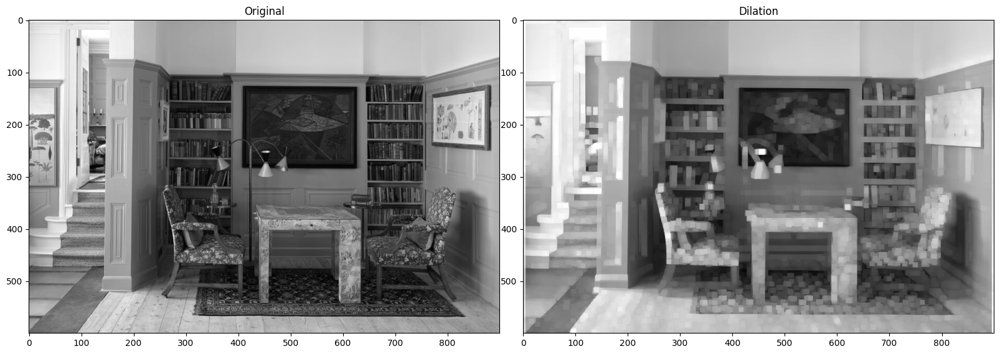

In [4]:
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(ex_im1_arr, cmap='gray')
plt.title('Original')

plt.subplot(1, 2, 2)
plt.imshow(dilation(ex_im1_arr, kernel), cmap='gray')
plt.title('Dilation')


plt.subplots_adjust(wspace=0.05)
plt.show()

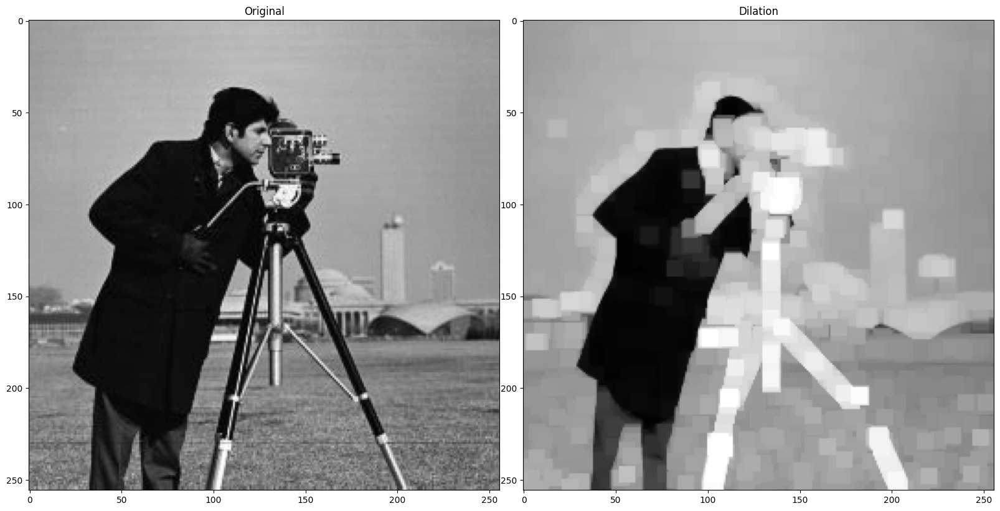

In [6]:
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(ex_im2_arr, cmap='gray')
plt.title('Original')

plt.subplot(1, 2, 2)
plt.imshow(dilation(ex_im2_arr, kernel), cmap='gray')
plt.title('Dilation')

plt.subplots_adjust(wspace=0.05)
plt.show()

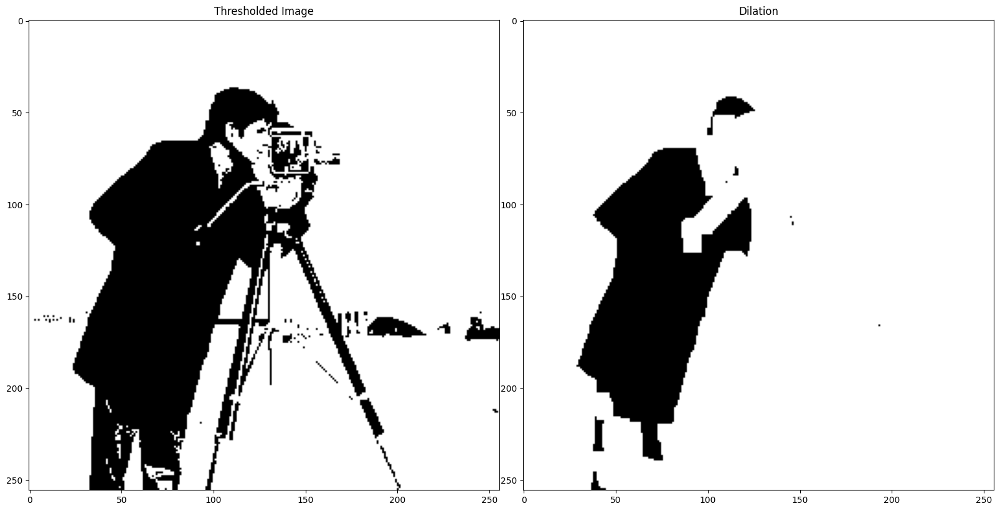

In [7]:
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(thresholded_image_2, cmap='gray')
plt.title('Thresholded Image')

plt.subplot(1, 2, 2)
plt.imshow(dilation(thresholded_image_2, kernel), cmap='gray')
plt.title('Dilation')

plt.subplots_adjust(wspace=0.05)
plt.show()

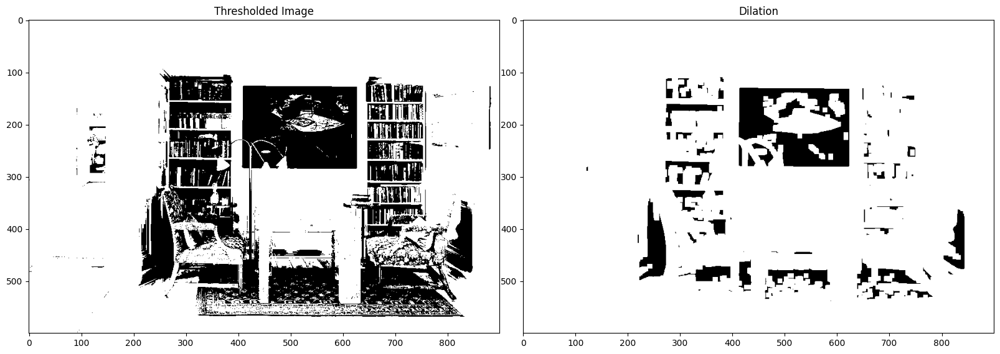

In [8]:
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(thresholded_image_1, cmap='gray')
plt.title('Thresholded Image')

plt.subplot(1, 2, 2)
plt.imshow(dilation(thresholded_image_1, kernel), cmap='gray')
plt.title('Dilation')

plt.subplots_adjust(wspace=0.05)
plt.show()

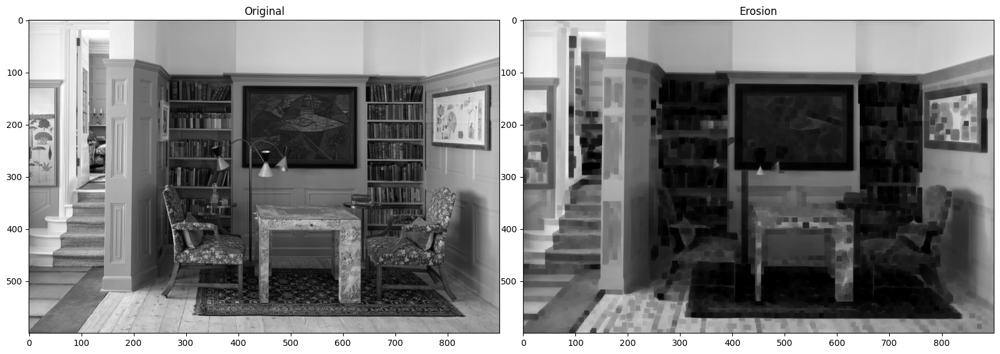

In [9]:
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(ex_im1_arr, cmap='gray')
plt.title('Original')

plt.subplot(1, 2, 2)
plt.imshow(erosion(ex_im1_arr, kernel), cmap='gray')
plt.title('Erosion')



plt.subplots_adjust(wspace=0.05)
plt.show()


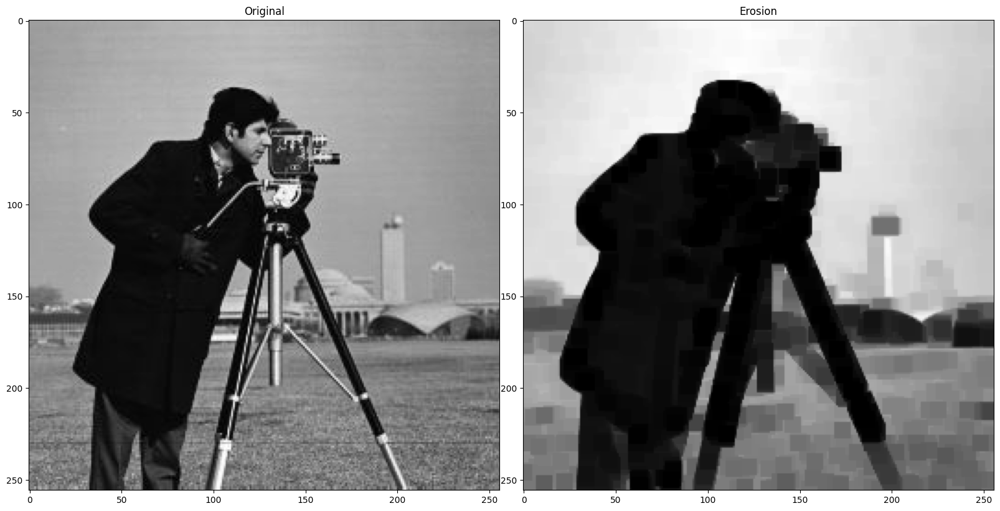

In [10]:
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(ex_im2_arr, cmap='gray')
plt.title('Original')

plt.subplot(1, 2, 2)
plt.imshow(erosion(ex_im2_arr, kernel), cmap='gray')
plt.title('Erosion')


plt.subplots_adjust(wspace=0.05)
plt.show()

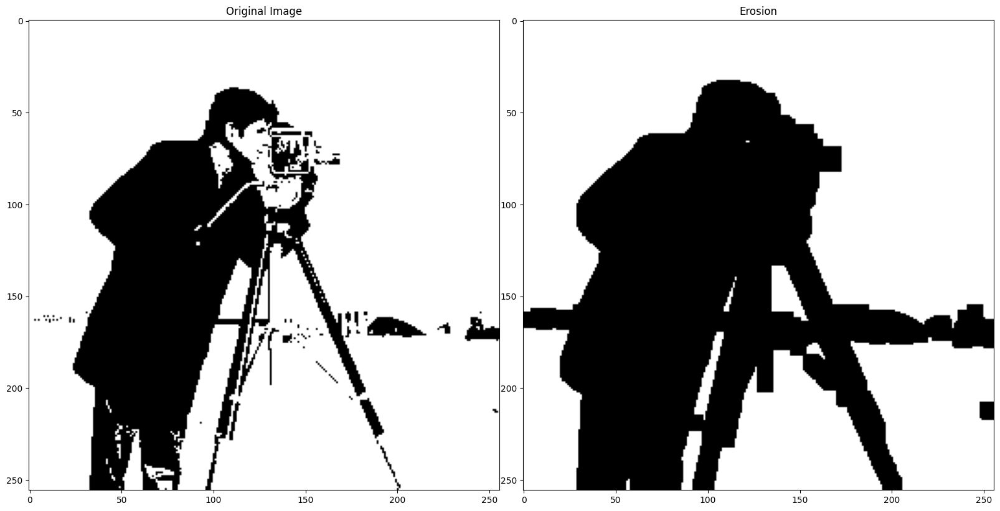

In [11]:
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(thresholded_image_2, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(erosion(thresholded_image_2, kernel), cmap='gray')
plt.title('Erosion')

plt.subplots_adjust(wspace=0.05)
plt.show()

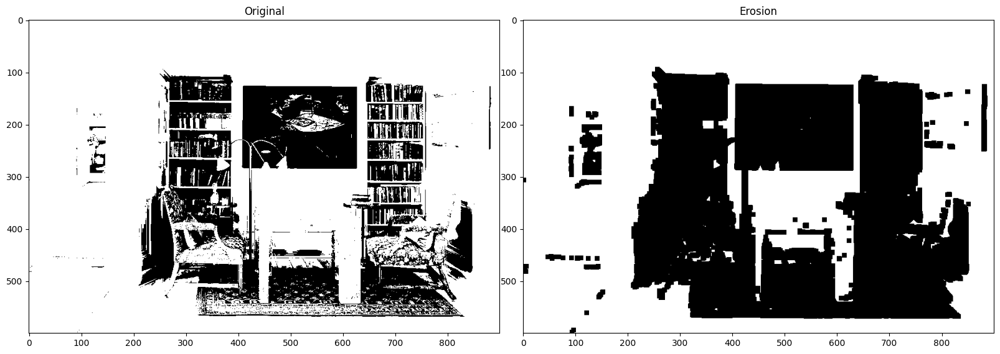

In [13]:
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
plt.imshow(thresholded_image_1, cmap='gray')
plt.title('Original')

plt.subplot(1, 2, 2)
plt.imshow(erosion(thresholded_image_1, kernel), cmap='gray')
plt.title('Erosion')


plt.subplots_adjust(wspace=0.05)
plt.show()

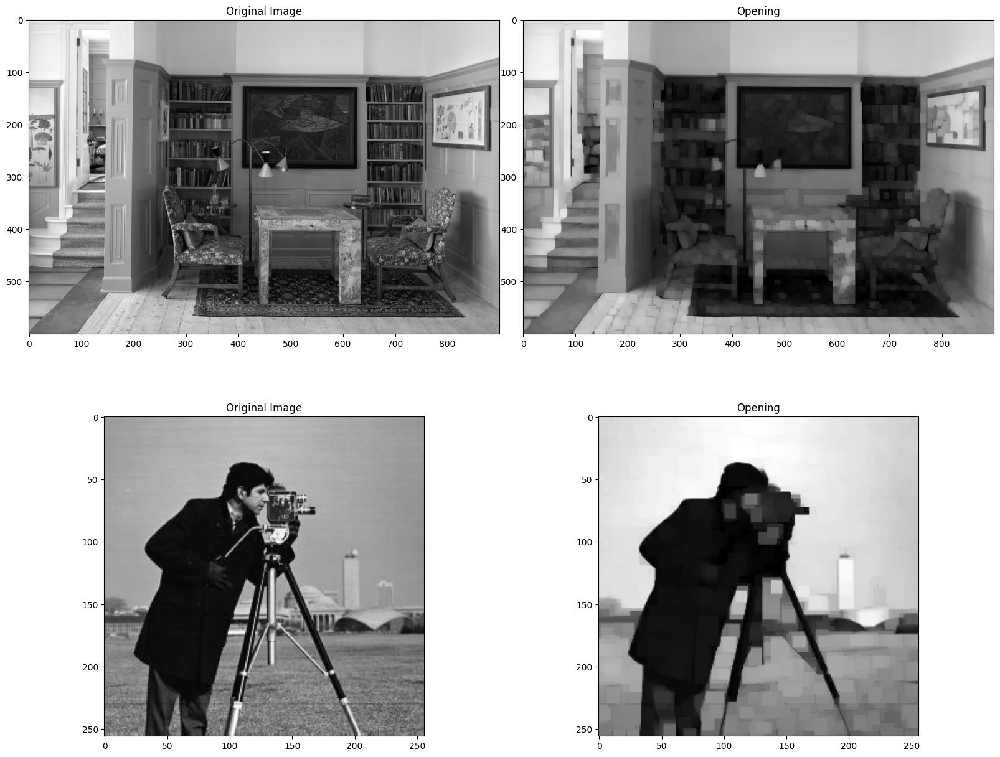

In [84]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(ex_im1_arr, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(opening(ex_im1_arr, kernel), cmap='gray')
plt.title('Opening')

plt.subplot(2, 2, 3)
plt.imshow(ex_im2_arr, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(opening(ex_im2_arr, kernel), cmap='gray')
plt.title('Opening')

plt.subplots_adjust(wspace=0.05)
plt.show()


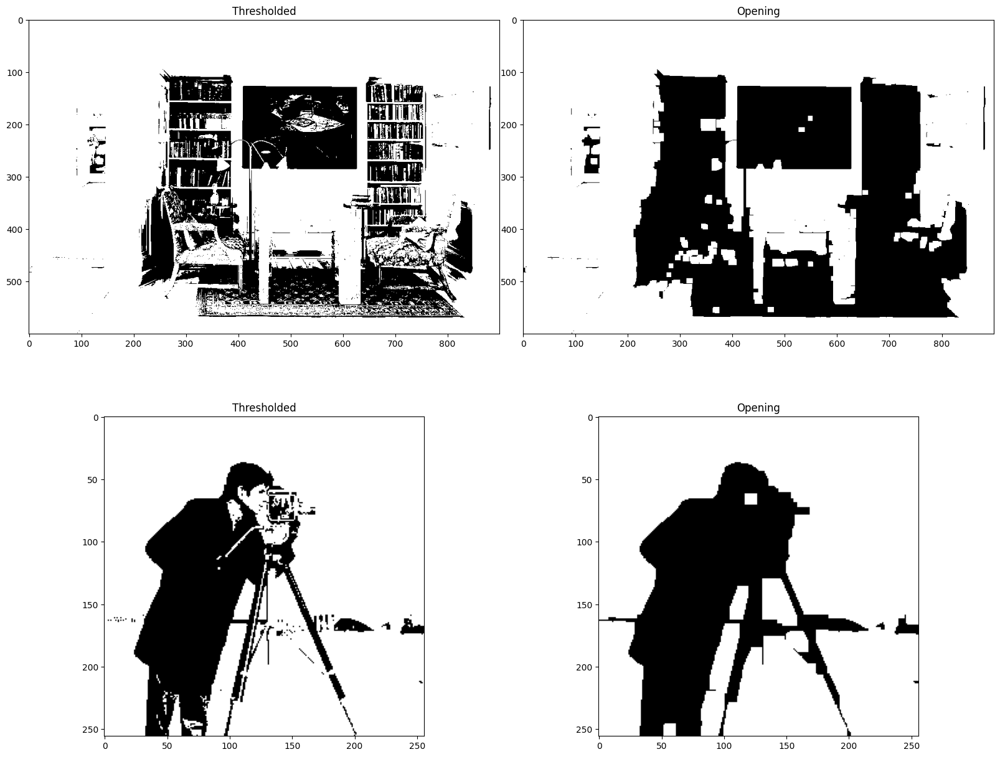

In [85]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(thresholded_image_1, cmap='gray')
plt.title('Thresholded')

plt.subplot(2, 2, 2)
plt.imshow(opening(thresholded_image_1, kernel), cmap='gray')
plt.title('Opening')

plt.subplot(2, 2, 3)
plt.imshow(thresholded_image_2, cmap='gray')
plt.title('Thresholded')

plt.subplot(2, 2, 4)
plt.imshow(opening(thresholded_image_2, kernel), cmap='gray')
plt.title('Opening')

plt.subplots_adjust(wspace=0.05)
plt.show()


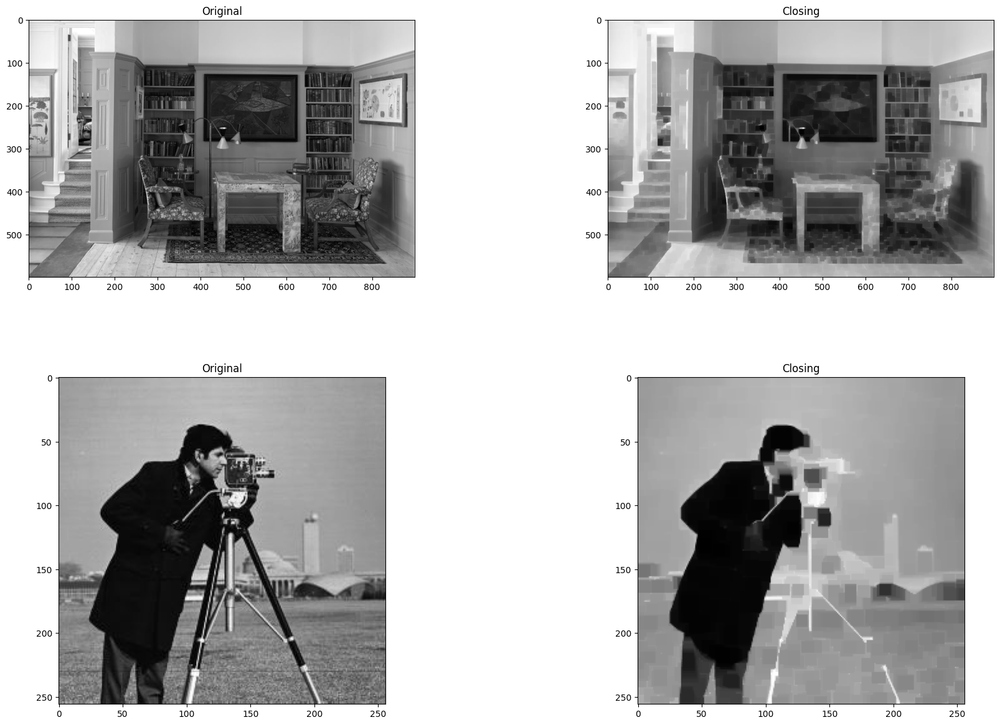

In [102]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(ex_im1_arr,cmap='gray')
plt.title('Original')

plt.subplot(2, 2, 2)
plt.imshow(closing(ex_im1_arr,kernel), cmap='gray')
plt.title('Closing')

plt.subplot(2, 2, 3)
plt.imshow(ex_im2_arr,cmap='gray')
plt.title('Original')

plt.subplot(2, 2, 4)
plt.imshow(closing(ex_im2_arr,kernel), cmap='gray')
plt.title('Closing')

plt.subplots_adjust(wspace=0.5)
plt.show()


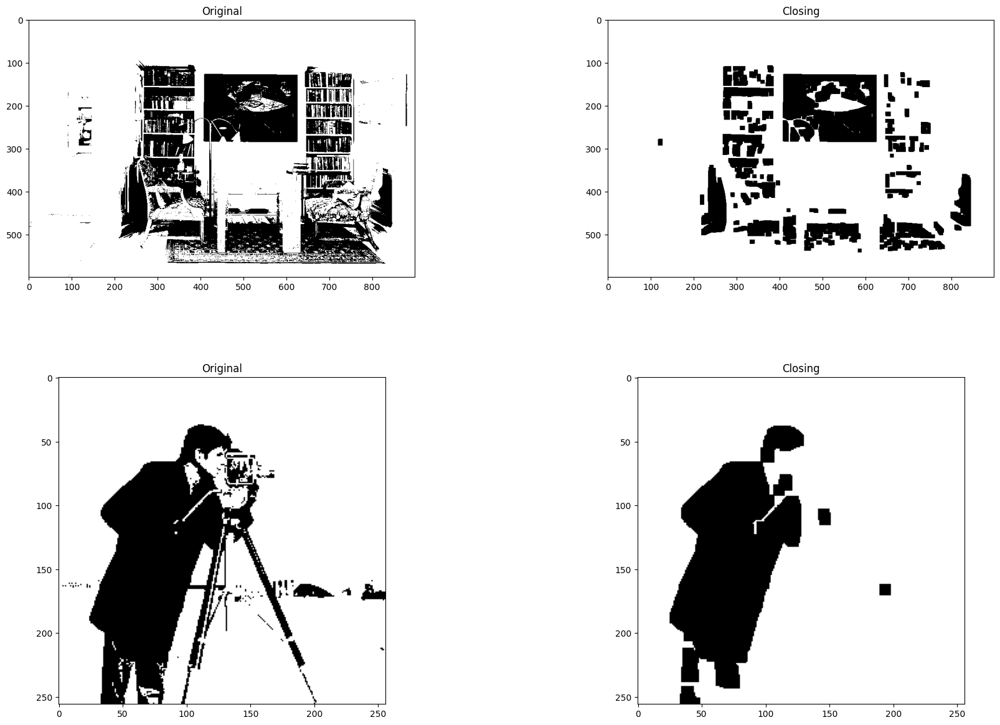

In [103]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(thresholded_image_1,cmap='gray')
plt.title('Original')

plt.subplot(2, 2, 2)
plt.imshow(closing(thresholded_image_1,kernel), cmap='gray')
plt.title('Closing')

plt.subplot(2, 2, 3)
plt.imshow(thresholded_image_2,cmap='gray')
plt.title('Original')

plt.subplot(2, 2, 4)
plt.imshow(closing(thresholded_image_2,kernel), cmap='gray')
plt.title('Closing')

plt.subplots_adjust(wspace=0.5)
plt.show()


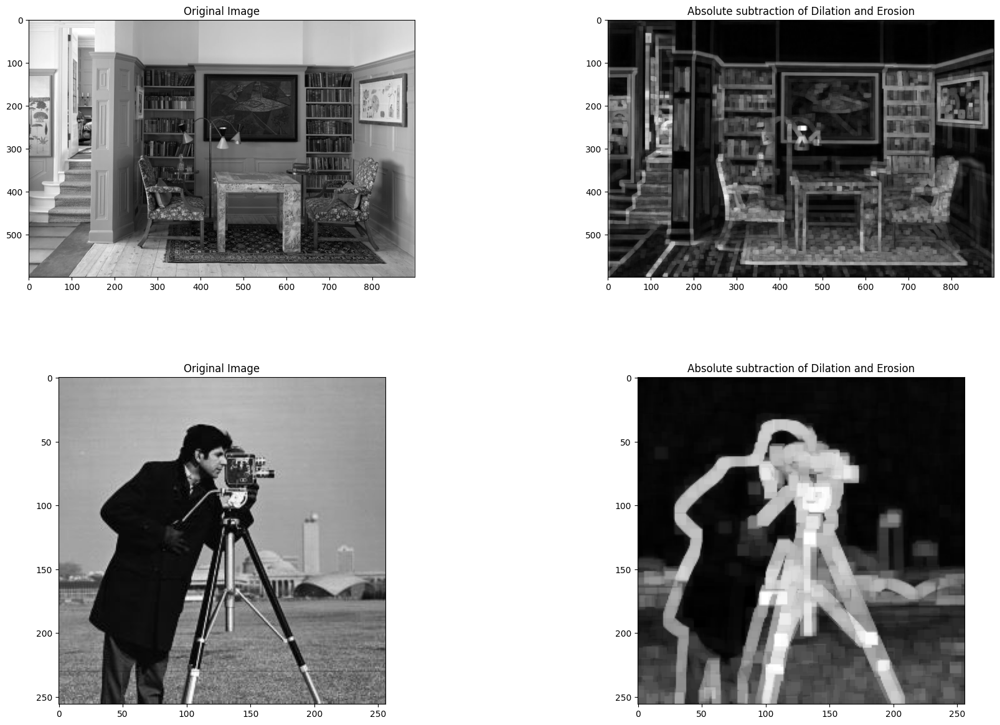

In [104]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(ex_im1_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(dilation(ex_im1_arr,kernel)-erosion(ex_im1_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Dilation and Erosion')

plt.subplot(2, 2, 3)
plt.imshow(ex_im2_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(dilation(ex_im2_arr,kernel)-erosion(ex_im2_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Dilation and Erosion')

plt.subplots_adjust(wspace=0.5)
plt.show()



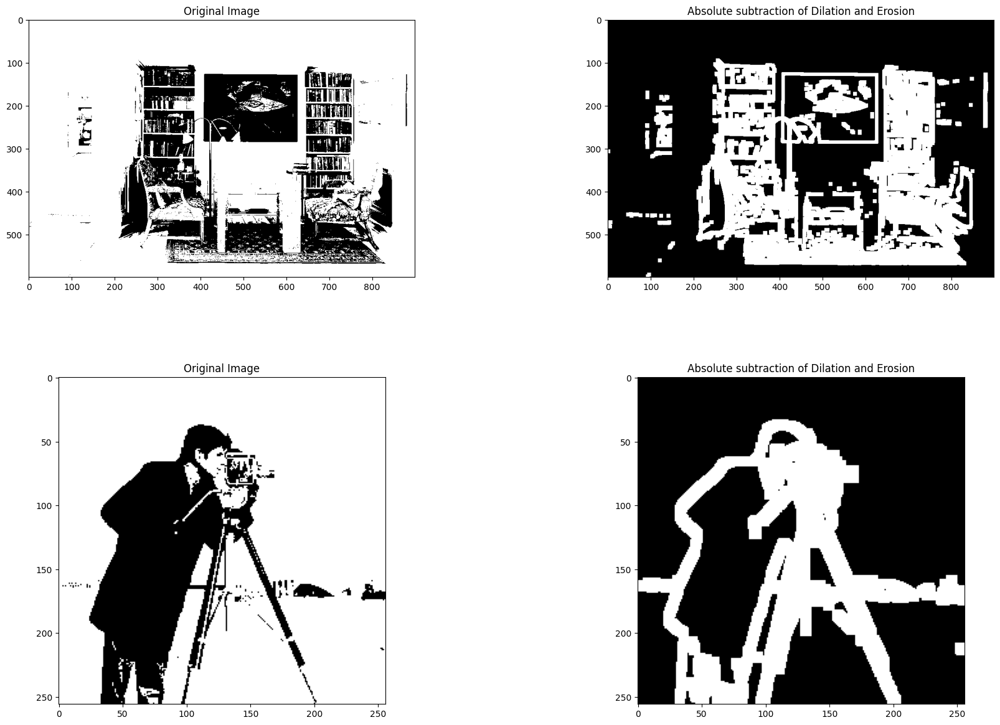

In [105]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(thresholded_image_1,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(dilation(thresholded_image_1,kernel)-erosion(thresholded_image_1,kernel)), cmap='gray')
plt.title('Absolute subtraction of Dilation and Erosion')

plt.subplot(2, 2, 3)
plt.imshow(thresholded_image_2,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(dilation(thresholded_image_2,kernel)-erosion(thresholded_image_2,kernel)), cmap='gray')
plt.title('Absolute subtraction of Dilation and Erosion')

plt.subplots_adjust(wspace=0.5)
plt.show()




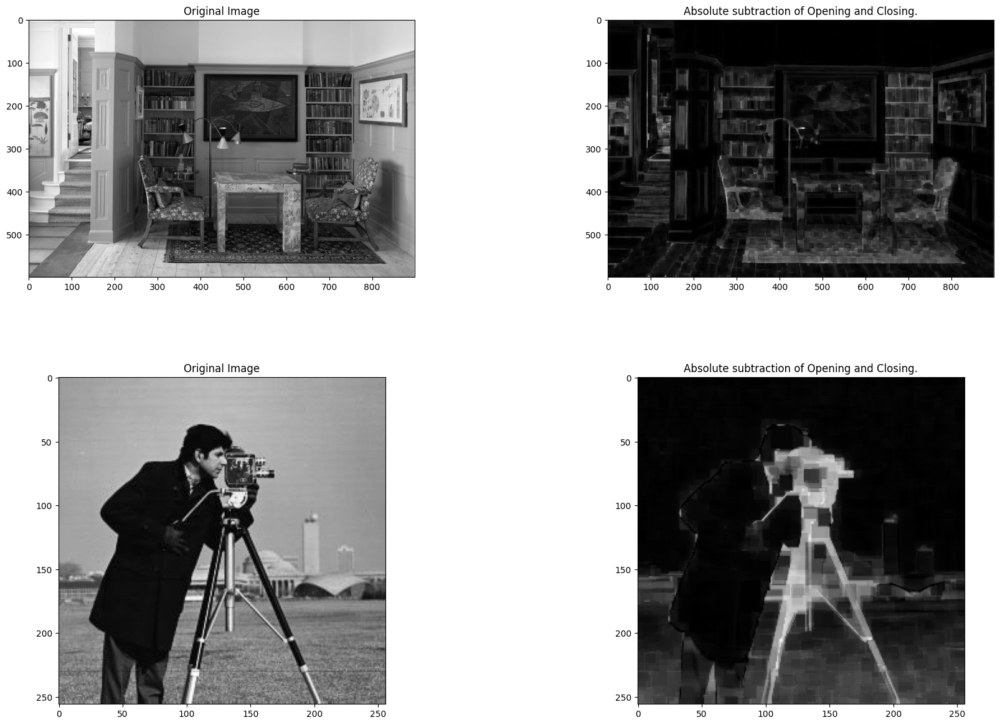

In [106]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(ex_im1_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(opening(ex_im1_arr,kernel)-closing(ex_im1_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Opening and Closing.')

plt.subplot(2, 2, 3)
plt.imshow(ex_im2_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(opening(ex_im2_arr,kernel)-closing(ex_im2_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Opening and Closing.')

plt.subplots_adjust(wspace=0.5)
plt.show()

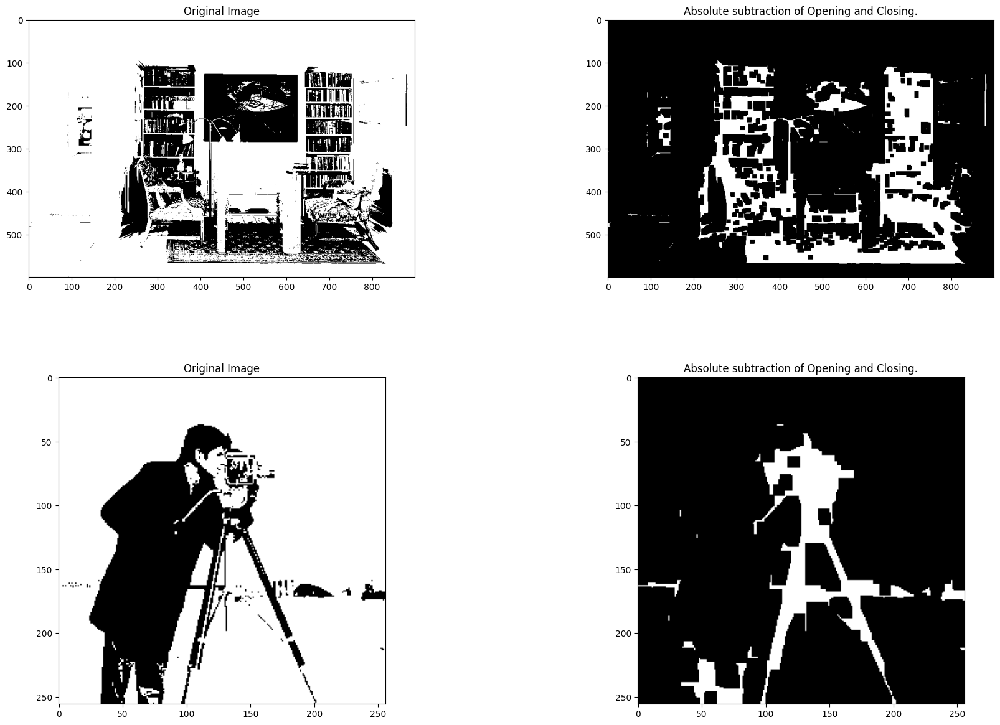

In [107]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(thresholded_image_1,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(opening(thresholded_image_1,kernel)-closing(thresholded_image_1,kernel)), cmap='gray')
plt.title('Absolute subtraction of Opening and Closing.')

plt.subplot(2, 2, 3)
plt.imshow(thresholded_image_2,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(opening(thresholded_image_2,kernel)-closing(thresholded_image_2,kernel)), cmap='gray')
plt.title('Absolute subtraction of Opening and Closing.')

plt.subplots_adjust(wspace=0.5)
plt.show()

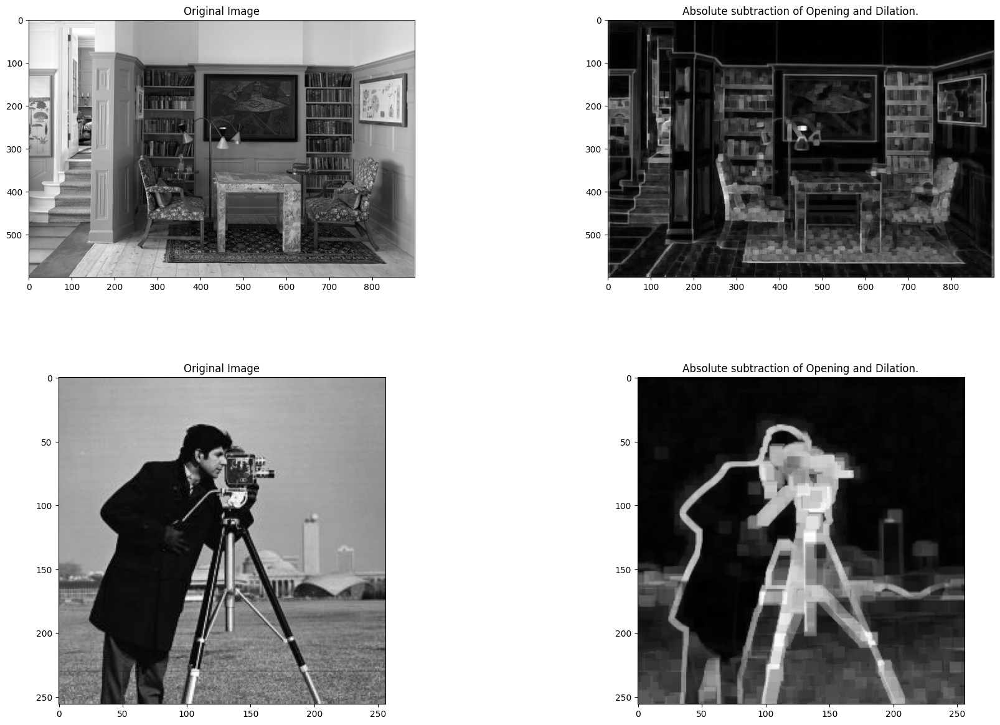

In [108]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(ex_im1_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(opening(ex_im1_arr,kernel)-dilation(ex_im1_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Opening and Dilation.')

plt.subplot(2, 2, 3)
plt.imshow(ex_im2_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(opening(ex_im2_arr,kernel)-dilation(ex_im2_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Opening and Dilation.')


plt.subplots_adjust(wspace=0.5)
plt.show()

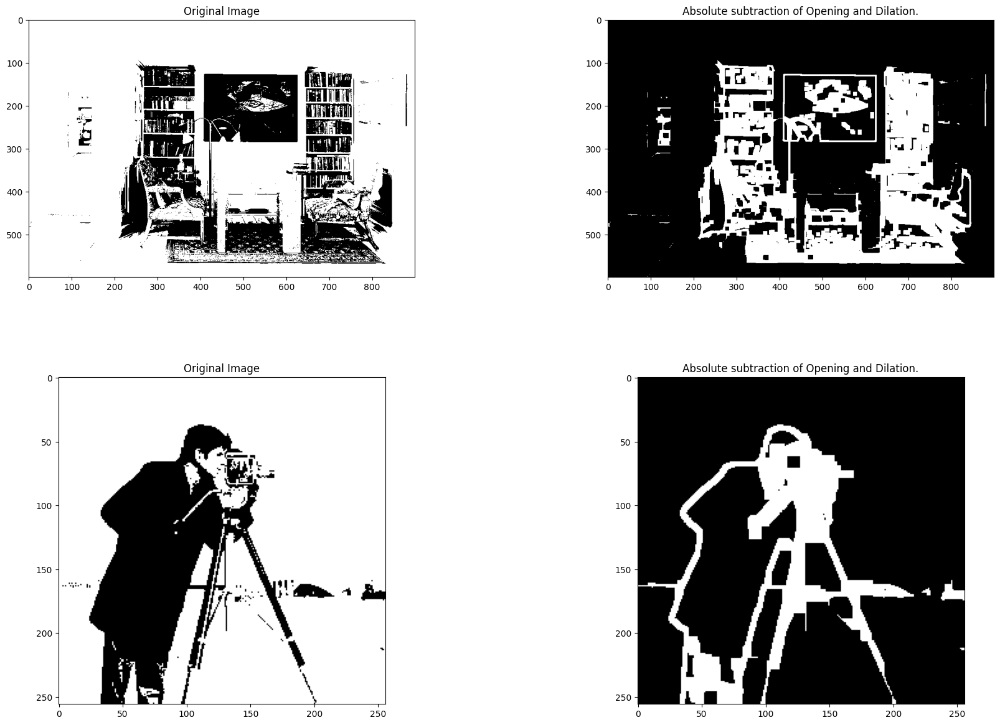

In [109]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(thresholded_image_1,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(opening(thresholded_image_1,kernel)-dilation(thresholded_image_1,kernel)), cmap='gray')
plt.title('Absolute subtraction of Opening and Dilation.')

plt.subplot(2, 2, 3)
plt.imshow(thresholded_image_2,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(opening(thresholded_image_2,kernel)-dilation(thresholded_image_2,kernel)), cmap='gray')
plt.title('Absolute subtraction of Opening and Dilation.')

plt.subplots_adjust(wspace=0.5)
plt.show()

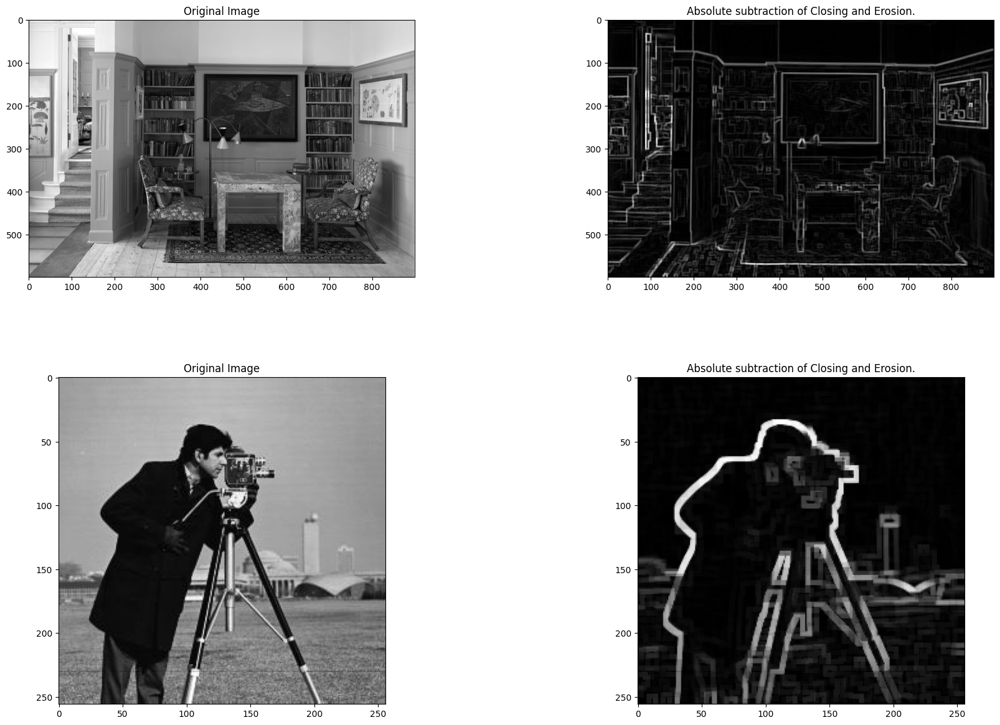

In [110]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(ex_im1_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(opening(ex_im1_arr,kernel)-erosion(ex_im1_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplot(2, 2, 3)
plt.imshow(ex_im2_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(opening(ex_im2_arr,kernel)-erosion(ex_im2_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplots_adjust(wspace=0.5)
plt.show()

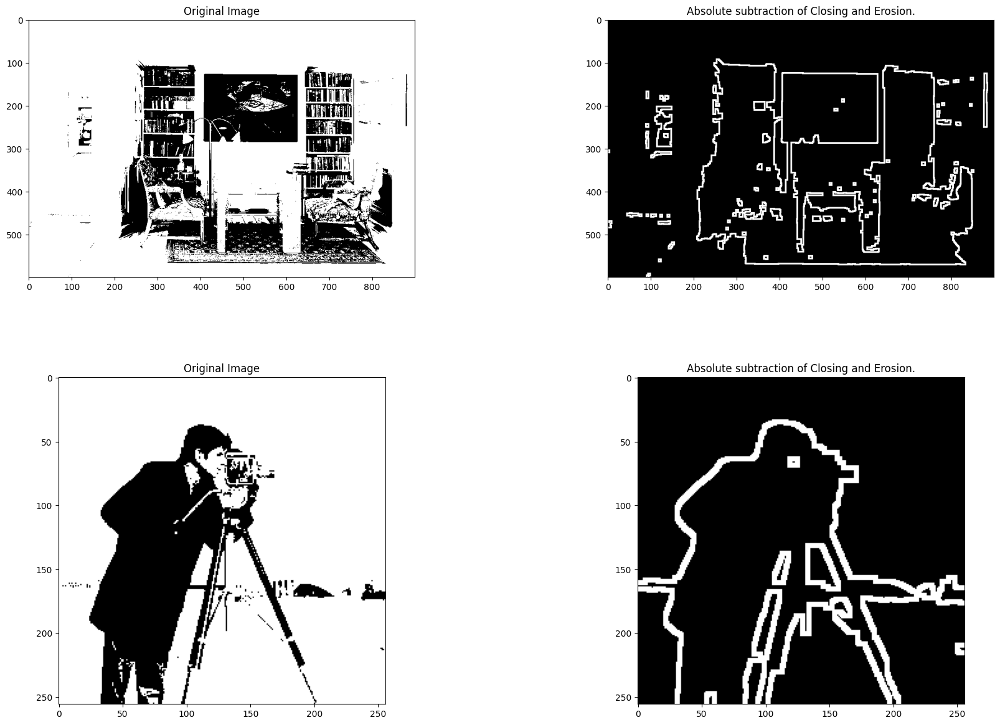

In [111]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(thresholded_image_1,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(opening(thresholded_image_1,kernel)-erosion(thresholded_image_1,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplot(2, 2, 3)
plt.imshow(thresholded_image_2,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(opening(thresholded_image_2,kernel)-erosion(thresholded_image_2,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')


plt.subplots_adjust(wspace=0.5)
plt.show()

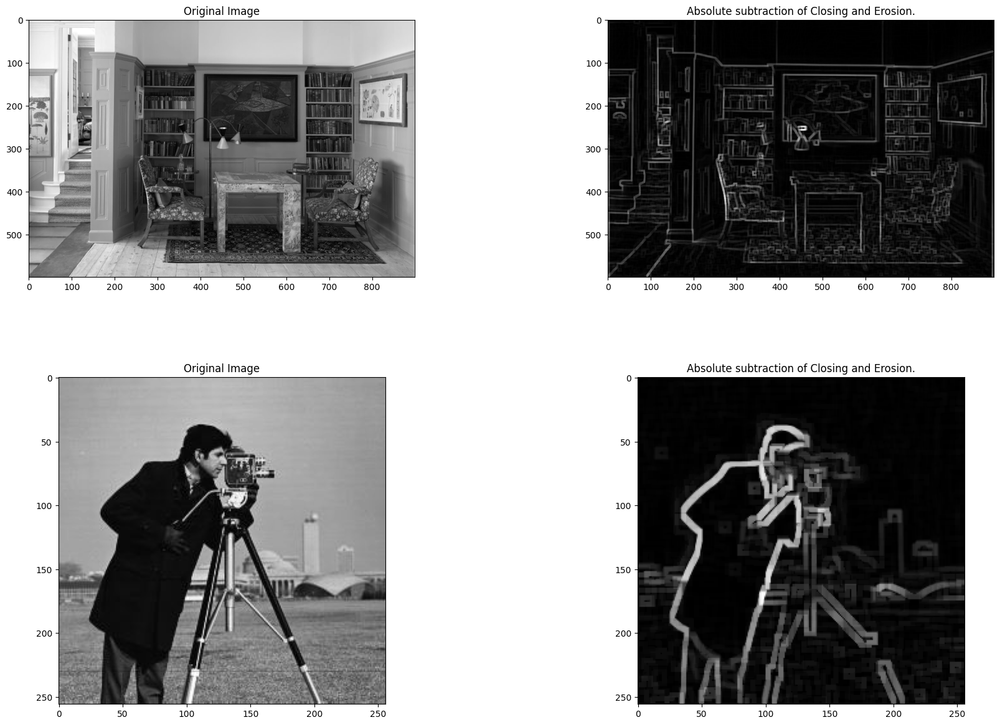

In [112]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(ex_im1_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(closing(ex_im1_arr,kernel)-dilation(ex_im1_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplot(2, 2, 3)
plt.imshow(ex_im2_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(closing(ex_im2_arr,kernel)-dilation(ex_im2_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplots_adjust(wspace=0.5)
plt.show()

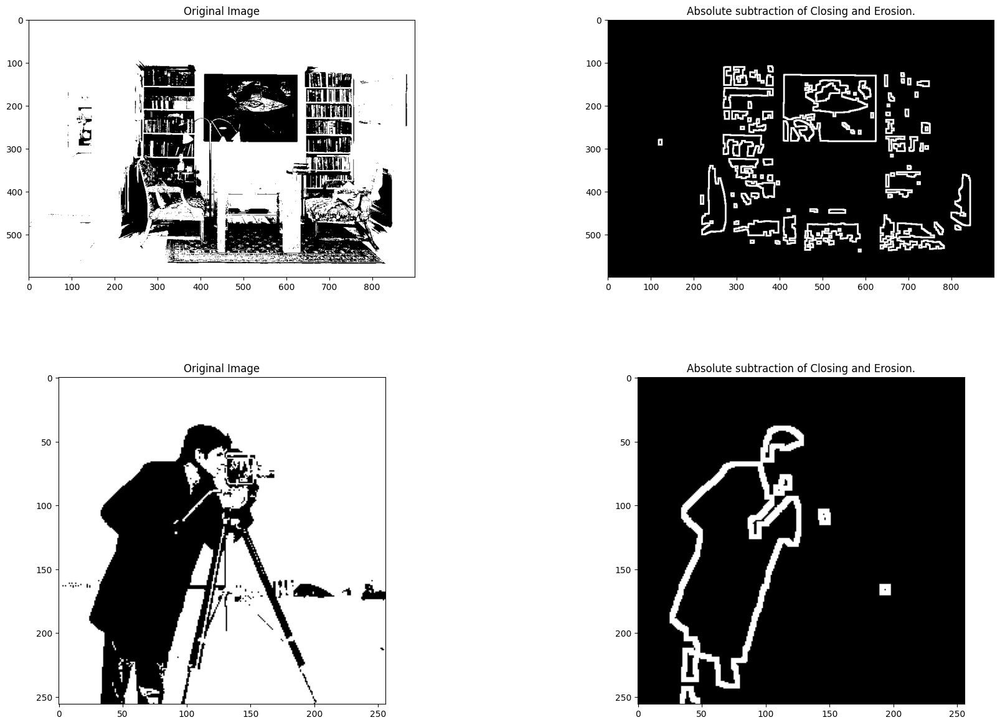

In [113]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(thresholded_image_1,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(closing(thresholded_image_1,kernel)-dilation(thresholded_image_1,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplot(2, 2, 3)
plt.imshow(thresholded_image_2,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(closing(thresholded_image_2,kernel)-dilation(thresholded_image_2,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplots_adjust(wspace=0.5)
plt.show()

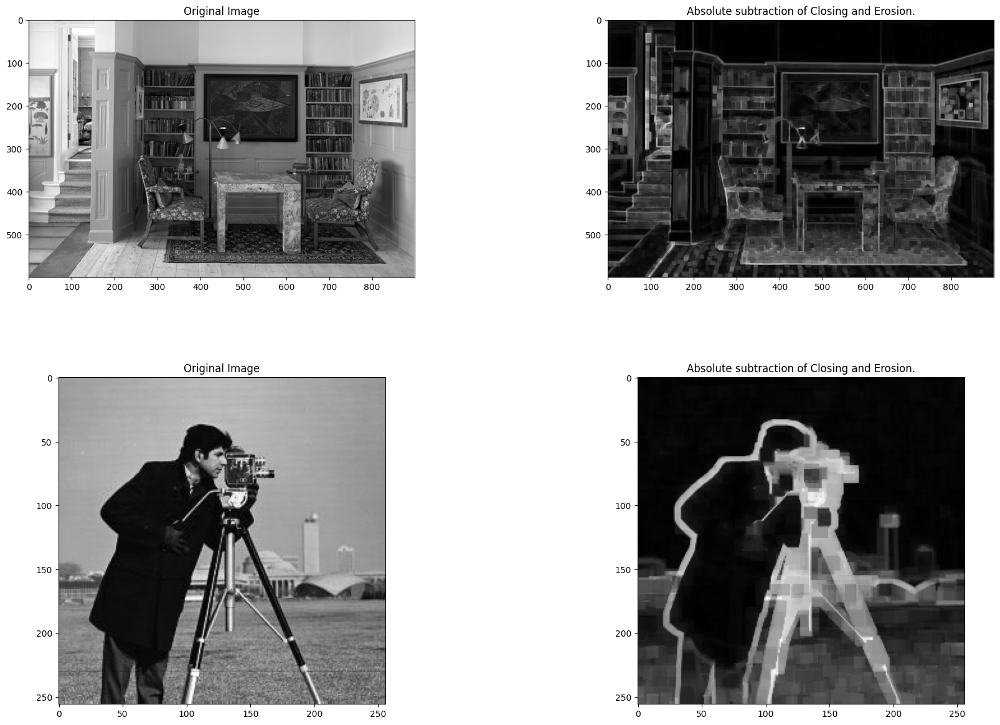

In [114]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(ex_im1_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(closing(ex_im1_arr,kernel)-erosion(ex_im1_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplot(2, 2, 3)
plt.imshow(ex_im2_arr,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(closing(ex_im2_arr,kernel)-erosion(ex_im2_arr,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplots_adjust(wspace=0.5)
plt.show()

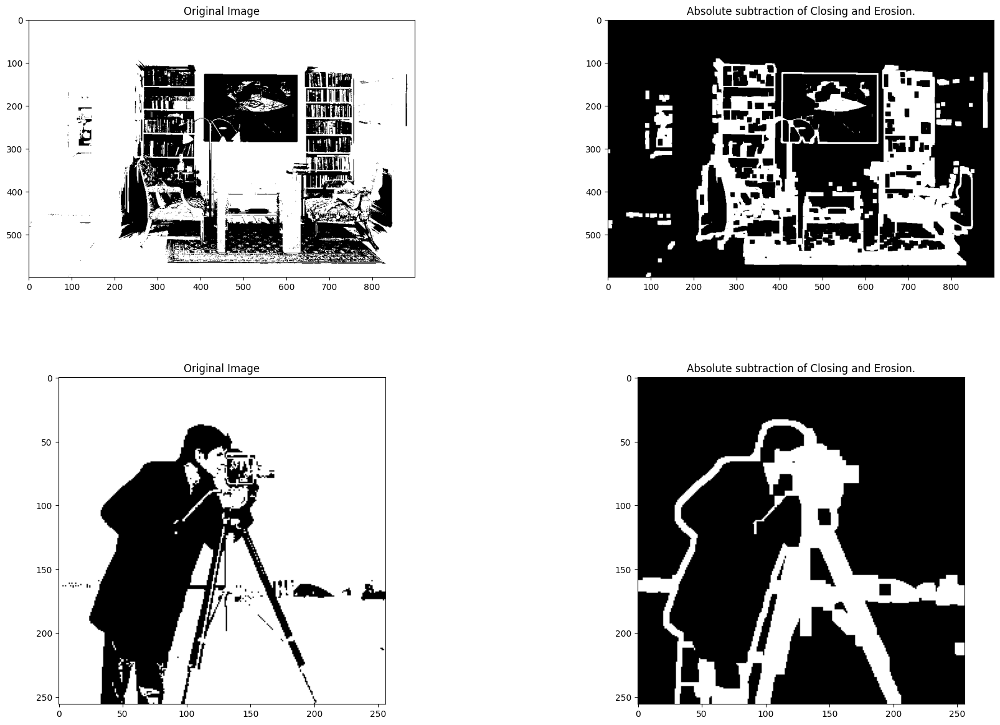

In [115]:
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.imshow(thresholded_image_1,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(np.abs(closing(thresholded_image_1,kernel)-erosion(thresholded_image_1,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplot(2, 2, 3)
plt.imshow(thresholded_image_2,cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 4)
plt.imshow(np.abs(closing(thresholded_image_2,kernel)-erosion(thresholded_image_2,kernel)), cmap='gray')
plt.title('Absolute subtraction of Closing and Erosion.')

plt.subplots_adjust(wspace=0.5)
plt.show()